# JuliaAstro Package Tutorials 1

## Curve Fitting

In [2]:
versioninfo()

Julia Version 1.8.0
Commit 5544a0fab7 (2022-08-17 13:38 UTC)
Platform Info:
  OS: Windows (x86_64-w64-mingw32)
  CPU: 16 × 12th Gen Intel(R) Core(TM) i7-1260P
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-13.0.1 (ORCJIT, goldmont)
  Threads: 1 on 16 virtual cores


## Generating the data

In [3]:
using Random

In [4]:
Random.seed!(1234)

TaskLocalRNG()

In [7]:
# generating the data

x = 0:5:100 # Or equivalently: range(0, 100, step = 5)
x

0:5:100

In [9]:
y = (x ./ 20 .- 0.2).^2 .+ 2 .+ randn(length(x))

# The randn function generates a random value normally distributed around 0 with a standard deviation of 1
# randn -> norm(0, 1)

21-element Vector{Float64}:
  1.313857674365737
  1.761929928024603
  3.0327328405545986
  2.29258728361218
  2.402803258886548
  2.8684530828827466
  4.89821447744065
  5.714652775988446
  5.5637050517386015
  5.444662867481133
  8.459342632434396
  9.98036713397927
  9.787272686192402
 11.536996155923392
 12.877794252911094
 13.981795591762893
 17.24585261847235
 18.307351233922237
 21.22320505436918
 23.70334541627428
 25.158087636126844

In [10]:
using Plots

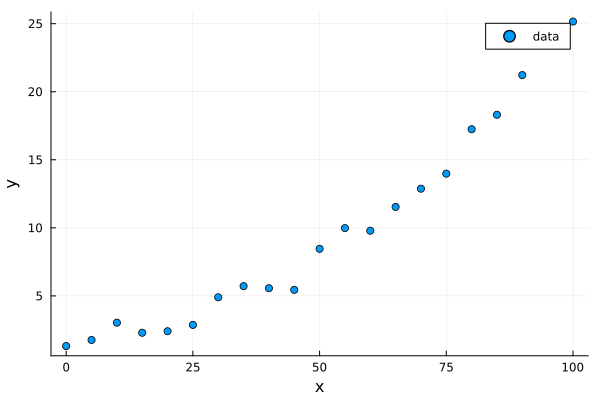

In [11]:
scatter(x, y; xlabel = "x", ylabel = "y", label = "data")

## Linear regression

In [12]:
A = [ 
        length(x) sum(x)
        sum(x) sum(x.^2)
]

b = [
    sum(y)
    sum(y .* x)
]

2-element Vector{Float64}:
   207.5550096533436
 14880.427291934944

In [13]:
# intercept [1] and slope [2] calculation 

c = A\b

2-element Vector{Float64}:
 -1.8116925514020719
  0.2339052887931306

* helper function **`linfunc`**

In [14]:
linfunc(x; slope, intercept) = slope*x + intercept

linfunc (generic function with 1 method)

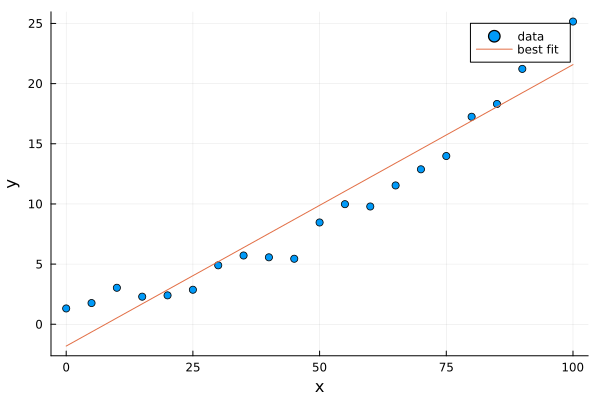

In [15]:
yfit = linfunc.(x; slope = c[2], intercept = c[1])
scatter(x, y, xlabel = "x", ylabel = "y", label = "data")
plot!(x, yfit, label = "best fit")

## JWST image with scale bar

In [16]:
using Downloads

In [20]:
# URL changed -> 재확인 필요

# fname = Downloads.download(
#    "https://stpubdata-jwst.stsci.edu/ero/jw02731/L3/t/"*
#    "jw02731-o001_t017_nircam_clear-f187n_i2d.fits"
# )

local_path_carina = ("E:\JuliaAstro\MAST_2023-01-17T0202\JWST\jw02731-o001_t017_nircam_clear-f187n/" *
                    "jw02731-o001_t017_nircam_clear-f187n_i2d.fits"

In [26]:
# https://mast.stsci.edu/portal/Mashup/Clients/Mast/Portal.html 에서 다운받은 fits 파일의 로컬 경로를 지정
# 참고영상: https://www.youtube.com/watch?v=evqXcRR0k5w

local_path_carina = ("E:/JuliaAstro/" *
"MAST_2023-01-17T0202/JWST/jw02731-o001_t017_nircam_clear-f187n/" *
"jw02731-o001_t017_nircam_clear-f187n_i2d.fits")

"E:/JuliaAstro/MAST_2023-01-17T0202/JWST/jw02731-o001_t017_nircam_clear-f187n/jw02731-o001_t017_nircam_clear-f187n_i2d.fits"

In [22]:
using AstroImages

In [27]:
carina_full = load(local_path_carina); # semi-colon prevents displaying the image

┌ Info: Image was loaded from HDU 2
└ @ AstroImages C:\Users\jeffr\.julia\packages\AstroImages\EY1Gr\src\io.jl:131


In [29]:
size(carina_full)

(14496, 8678)

Wow, that's over 120 megapixels!

AstroImages will fall back to downscaling it automatically before displaying it using `ImageTransformations.restrict`, 

but let's make our lives simpler and just use every 10th pixel:

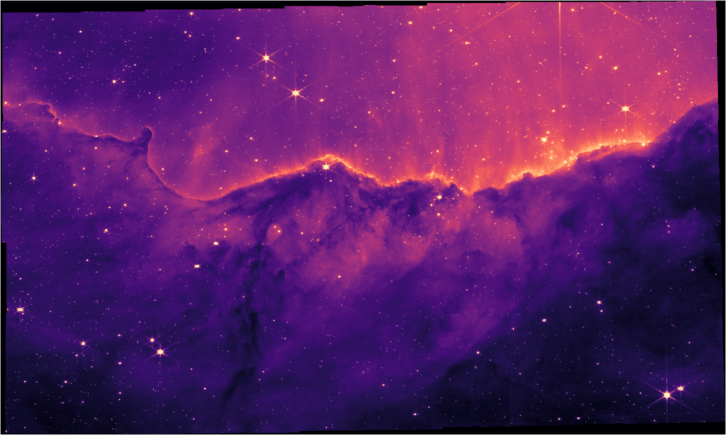

In [30]:
carina = carina_full[begin:10:end, begin:10:end]

**`imview`** is the function that was called automatically to display the image, but we can call it ourselves if we want to customize the display. We can make the image pop a little more by adjusting the display limits, or clims. These can be either a tuple of min and max values (i.e. (0.0, 100.0)) or a function to calculate them for us based on some criteria. We'll adjust the limits to remove the top and bottom 1% of all pixels:

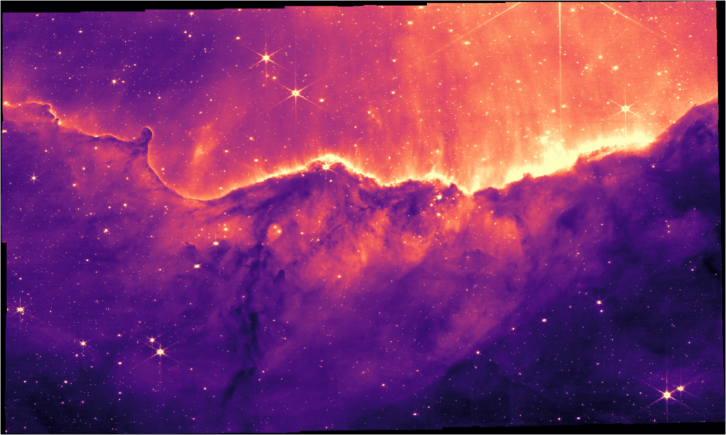

In [31]:
imview(carina; clims = Percent(98))

In Julia, **`keyword arguments`** come after positional arguments and they can be separated by a semi-colon.

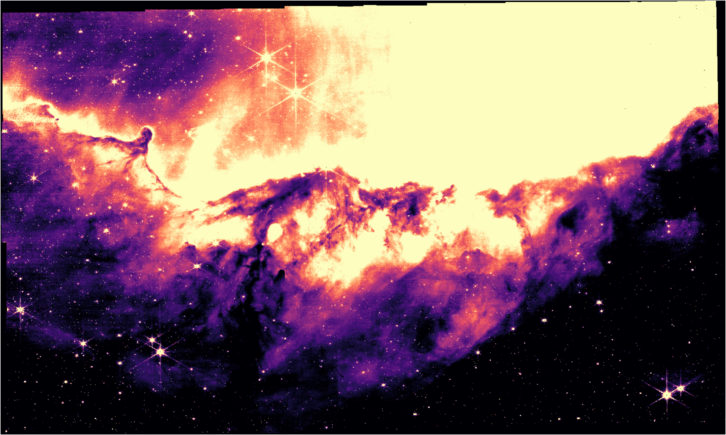

In [32]:
imview(carina; clims = Percent(50))

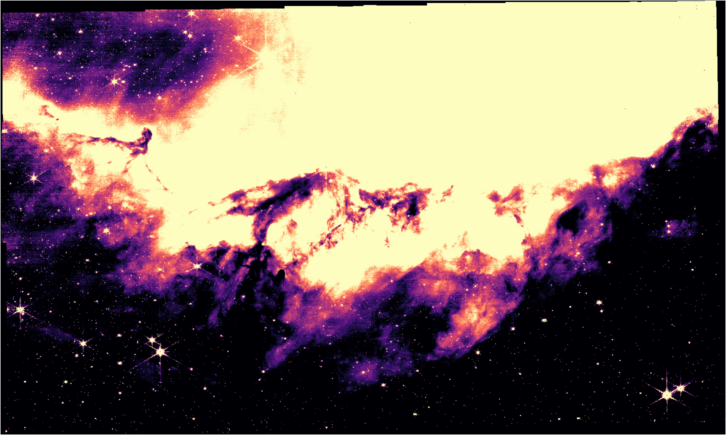

In [33]:
imview(carina; clims = Percent(30))

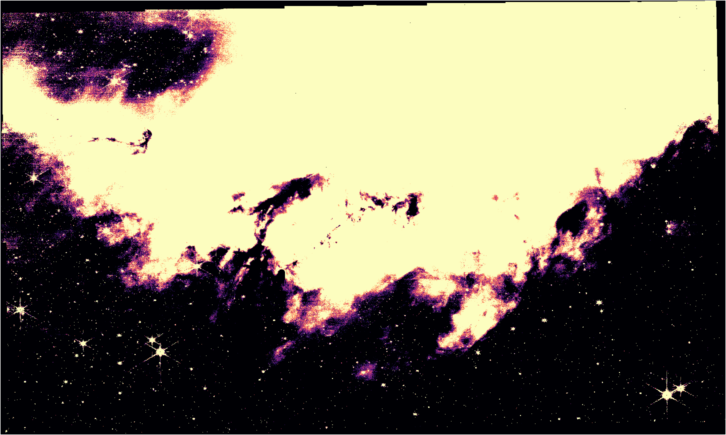

In [34]:
imview(carina; clims = Percent(10))

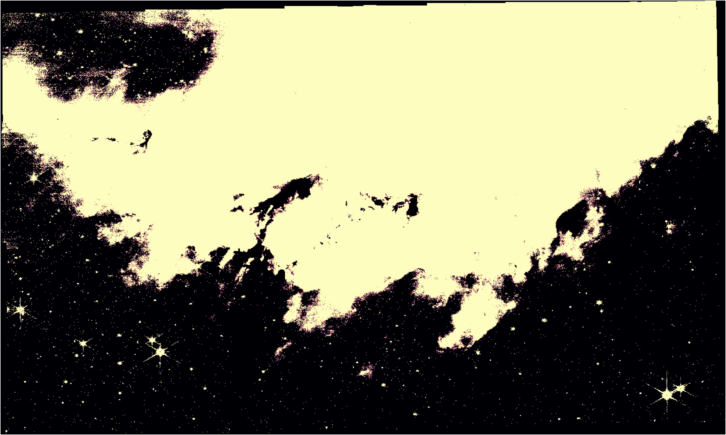

In [35]:
imview(carina; clims = Percent(2))

## Adding World Corrdinates

The image header already contains WCS keys to specify the location of the image in the sky. Let's take a peek at one of these header keys:

In [36]:
println(carina["CTYPE1", Comment])

Axis 1 type


In [37]:
println(carina["CTYPE1"])

RA---TAN


In [38]:
println(carina["CTYPE2", Comment])

Axis 2 type


In [39]:
println(carina["CTYPE2"])

DEC--TAN


In [42]:
typeof(carina.data)

Matrix{Float32} (alias for Array{Float32, 2})

In [46]:
carina.data[1:10, 1:10]

10×10 Matrix{Float32}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0

In [47]:
carina.dims

X Sampled{Int64} 1:10:14491 ForwardOrdered Regular Points,
Y Sampled{Int64} 1:10:8671 ForwardOrdered Regular Points

In [48]:
ndims(carina)

2

In [49]:
size(carina)

(1450, 868)

In [50]:
carina.header

XTENSION= 'IMAGE   '           / Image extension
BITPIX  =                  -32 / array data type
NAXIS   =                    2 / number of array dimensions
NAXIS1  =                14496
NAXIS2  =                 8678
PCOUNT  =                    0 / number of parameters
GCOUNT  =                    1 / number of groups
EXTNAME = 'SCI     '           / extension name
MJD-BEG =    59733.37547690324 / [d] exposure start time in MJD
MJD-AVG =    59733.48862276123 / [d] exposure mid-point in MJD
MJD-END =    59733.60158137731 / [d] exposure end time in MJD
TDB-BEG =    59733.38083258919 / [d] TDB time of exposure start in MJD
TDB-MID =    59733.49397718385 / [d] TDB time of exposure mid-point in MJD
TDB-END =    59733.60693452983 / [d] TDB time of exposure end in MJD
XPOSURE =             46382.88 / [s] Effective exposure time
TELAPSE =             46382.88 / [s] Total elapsed exposure time
                              
                               / JWST ephemeris information
       

In [51]:
carina.refdims

()

In [52]:
carina.wcs

1-element Vector{WCS.WCSTransform}:
 WCSTransform(naxis=2,cdelt=[1.0, 1.0],crval=[0.0, 0.0],crpix=[0.0, 0.0])

In [53]:
carina.wcs_stale

Base.RefValue{Bool}(true)

In [54]:
carina.wcsdims

X Sampled{Int64} Base.OneTo(14496) ForwardOrdered Regular Points,
Y Sampled{Int64} Base.OneTo(8678) ForwardOrdered Regular Points

In [55]:
using Plots

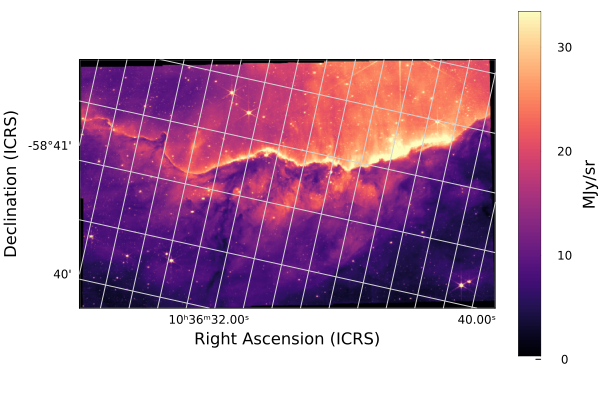

In [56]:
implot(carina; clims = Percent(98))

The image is titled compared to the right-ascension and declination celectial coordinate system, so the grid is rotated.

The colourbar on the right displays the units of the image: Mega-Jenskys per steradian: units of energy per collecting area, per spectral bandwidth, per solid-angle on the sky.


- Jansky(얀스키) 단위
- 스펙트럼 플럭스 밀도 또는 스펙트럼 조사 강도의 비 
     - $ S = \iint_{source}^{} B(\theta, \phi)d\Omega $
     - $ 1 Jy = 10^{-26} \ W \cdot m^{-2} \cdot Hz^{-1} $ watts per square metre per hertz


Let's turn off the grid for now:

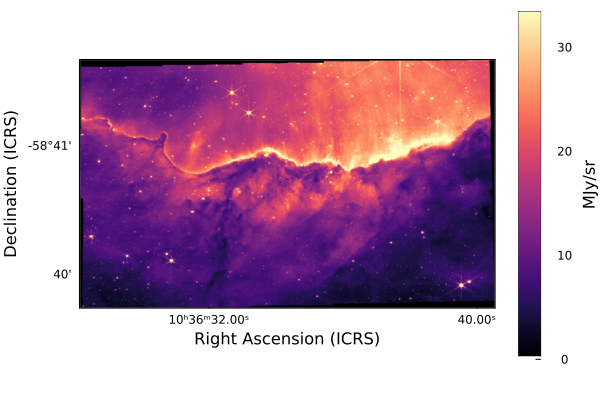

In [57]:
implot(carina; grid = false, clims = Percent(98))

- **소소한 컬러맵 변환** 

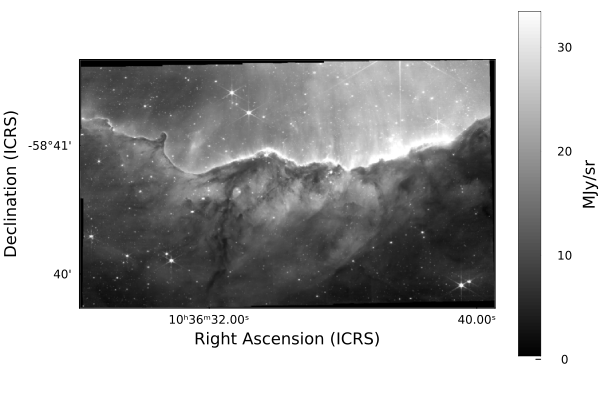

In [58]:
implot(carina; grid = false, clims = Percent(98), cmap = nothing)

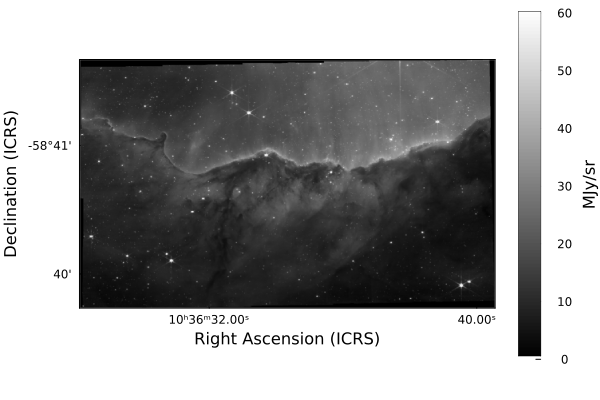

In [60]:
implot(carina; grid = false, clims = Zscale() , cmap = nothing)

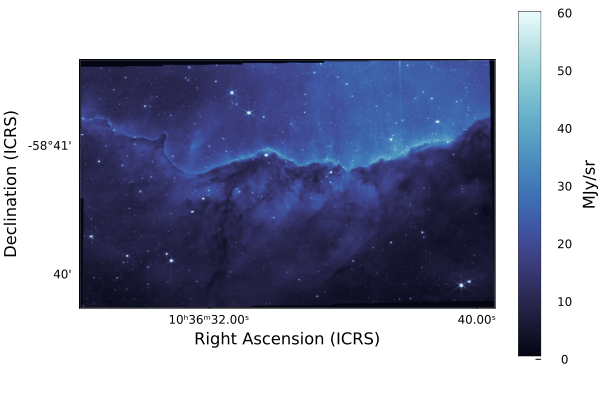

In [61]:
implot(carina; grid = false, clims = Zscale() , cmap = :ice)

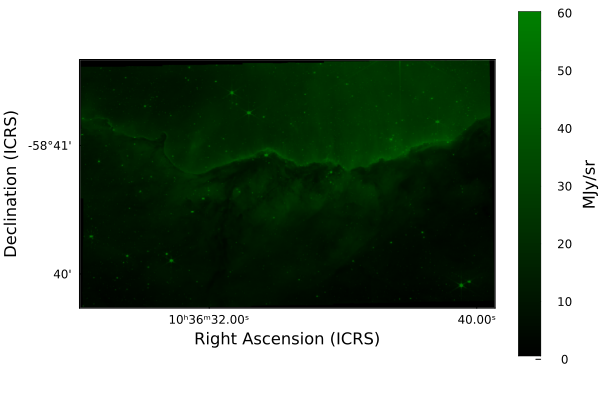

In [63]:
implot(carina; grid = false, clims = Zscale() , cmap = "green")

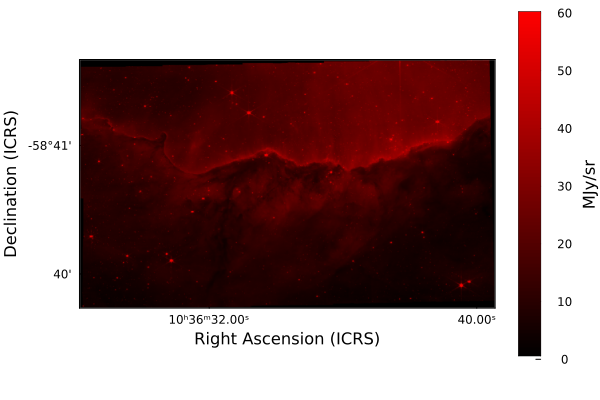

In [64]:
implot(carina; grid = false, clims = Zscale() , cmap = "red")

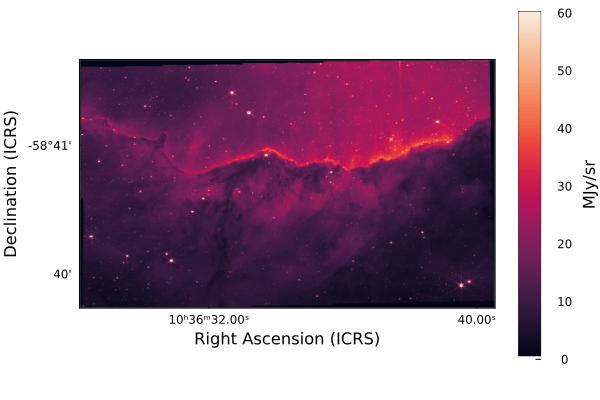

In [65]:
implot(carina; grid = false, clims = Zscale() , cmap = :seaborn_rocket_gradient)